In [1]:
import json
import pandas as pd

In [75]:
with open("vehicle_data/veh_data(4).json") as fp:
    data = json.load(fp)
    
flat_data = [{**v, **{"ts": int(t)}} for t, vs in data.items() for v in vs]
df = pd.DataFrame(flat_data)
df

,id,u,lane,speed,ts
0,200,660.097096,0,16.022066,1
1,201,625.532254,1,16.107800,1
2,202,590.953704,2,16.056451,1
3,203,556.376783,0,16.021389,1
4,204,521.811840,1,16.106118,1
...,...,...,...,...,...
69539,5087,37.995888,2,2.857231,998
69540,4614,27.131654,0,0.805465,998
69541,4685,26.180713,1,1.098298,998
69542,5343,18.379749,2,3.720794,998


/tmp/ipykernel_29764/2181645069.py:19: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(scalarmappaple)


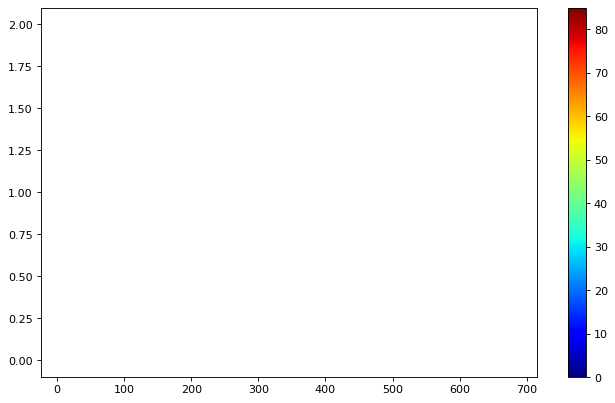

In [76]:
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

from IPython.display import HTML


fig, ax = plt.subplots(figsize=(10, 6), dpi=80)

df_t1 = df[df["ts"]==500]

normalize = mcolors.Normalize(vmin=df["speed"].min()*3.6, vmax=df["speed"].max()*3.6)
colormap = cm.jet

scalarmappaple = cm.ScalarMappable(norm=normalize, cmap=colormap)
scalarmappaple.set_array(df_t1["speed"])

scat = ax.scatter(df_t1["u"], df_t1["lane"], c=df_t1["speed"]*3.6)
plt.colorbar(scalarmappaple)

def update(frame):
    df_ti = df[df["ts"]==2*frame]
    scat.set_offsets(df_ti[["u", "lane"]])
    scat.set_array(df_ti["speed"]*3.6)

animation = FuncAnimation(fig, update, frames=df["ts"].max()//2)
HTML(animation.to_jshtml())